In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'buckeye'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [7]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=100,
    mel_upper_edge_hertz=7998,
    butter_lowcut = 100,
    butter_highcut = 7998,
    ref_level_db = 20,
    min_level_db = -40,
    mask_spec = True,
    win_length_ms = 4.0,
    hop_length_ms = 1.0,
    n_jobs = -1,
    verbosity=1,
    nex = -1
)

In [8]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.


[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    9.7s remaining:    4.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.8s finished


In [9]:
dataset.sample_json

OrderedDict([('species', 'Homo sapien'),
             ('age', 'o'),
             ('sex', 'f'),
             ('common_name', 'Human'),
             ('samplerate_hz', 16000),
             ('length_s', 587.8899375),
             ('wav_loc',
              '/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/processed/buckeye/2019-10-08_21-32-02/WAV/s0702b.WAV'),
             ('indvs',
              OrderedDict([('s07',
                            OrderedDict([('words',
                                          OrderedDict([('start_times',
                                                        [4.885333,
                                                         5.698899,
                                                         5.903525,
                                                         6.255056,
                                                         6.526125,
                                                         6.640816,
                                                    

In [11]:
n_jobs = -1
verbosity=1

In [12]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=[
                "labels",
                "utterance_number",
                "PoS",
                "position_in_utterance",
            ],
            unit="words",
            dict_features_to_retain=["age", "sex"],
            key=key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.


[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:   14.7s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   14.7s finished


9062

In [13]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 1

In [14]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=['labels', 'utterance_number', 'PoS', 'position_in_utterance'],
            unit="words",
            dict_features_to_retain = ['age', 'sex'],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.


[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:   11.9s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   11.9s finished


9062

In [14]:
syllable_df[:3]

,start_time,end_time,labels,utterance_number,PoS,position_in_utterance,indv,indvi,age,sex,key
0,4.885333,5.255262,well,0,RB,0,s07,0,o,f,s0702b
1,5.698899,5.903525,yknow,0,PRP_VBP,2,s07,0,o,f,s0702b
2,5.903525,6.099023,it,0,PRP,3,s07,0,o,f,s0702b


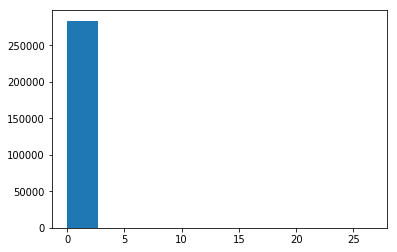

In [24]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values));

In [25]:
syllable_df = syllable_df[syllable_df.end_time.values - syllable_df.start_time.values < 3]

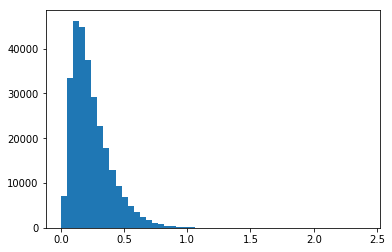

In [27]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values), bins=50);

In [31]:
syllable_df = syllable_df[syllable_df.end_time.values - syllable_df.start_time.values > 0.005]

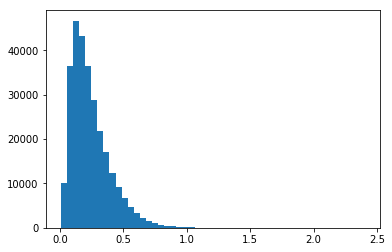

In [32]:
plt.hist(np.array(syllable_df.end_time.values - syllable_df.start_time.values), bins=50);

### get audio for dataset

In [16]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.


[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    9.3s remaining:    4.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.7s finished


9062

In [17]:
syllable_df[:3]

,start_time,end_time,labels,utterance_number,PoS,position_in_utterance,indv,indvi,age,sex,key,audio,rate
0,4.885333,5.255262,well,0,RB,0,s07,0,o,f,s0702b,"[-0.0019976329461109253, -0.001667859911609773...",16000
1,5.698899,5.903525,yknow,0,PRP_VBP,2,s07,0,o,f,s0702b,"[0.0003402321479013832, -0.0015044300901946254...",16000
2,5.903525,6.099023,it,0,PRP,3,s07,0,o,f,s0702b,"[-0.0745032684482881, -0.03571345688288944, -0...",16000


In [18]:
sylls = syllable_df.audio.values

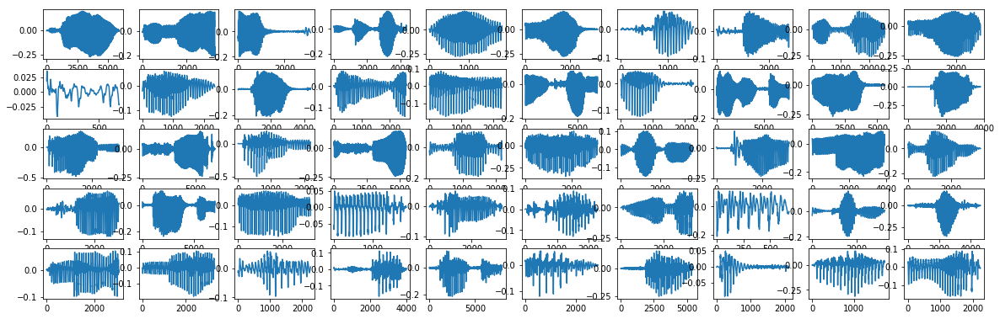

In [19]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [20]:
syllable_df['audio'] = [i/np.max(i) for i in tqdm(syllable_df.audio.values)]

### Create spectrograms

In [21]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [22]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [23]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 1888 tasks      | elapsed:    1.3s


[Parallel(n_jobs=-1)]: Done 9062 out of 9062 | elapsed:    6.0s finished


### Rescale spectrogram
- using log rescaling

In [24]:
log_scaling_factor = 4

In [25]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.


[Parallel(n_jobs=-1)]: Done 9062 out of 9062 | elapsed:    1.8s finished


(10.0, 10) (320, 320) 10.0 32 320


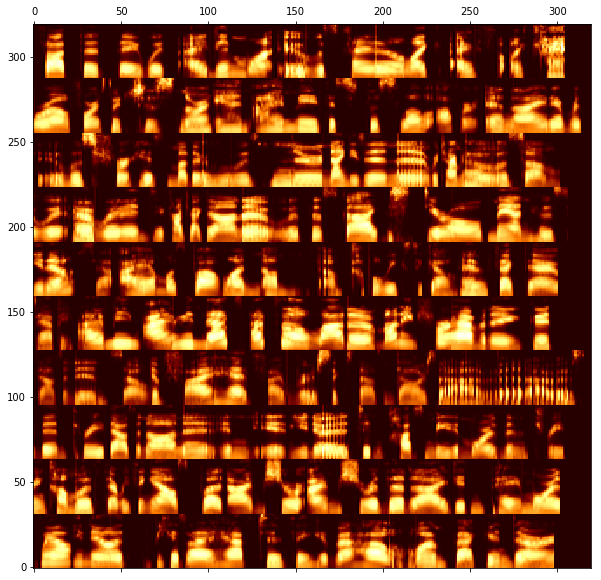

In [26]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=10)

### Pad spectrograms

In [27]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [28]:
syllable_df[:3]

,start_time,end_time,labels,utterance_number,PoS,position_in_utterance,indv,indvi,age,sex,key,audio,rate
0,4.885333,5.255262,well,0,RB,0,s07,0,o,f,s0702b,"[-0.009891687687084304, -0.008258749127846935,...",16000
1,5.698899,5.903525,yknow,0,PRP_VBP,2,s07,0,o,f,s0702b,"[0.0020050267415568897, -0.00886577761757358, ...",16000
2,5.903525,6.099023,it,0,PRP,3,s07,0,o,f,s0702b,"[-0.4616742369795508, -0.22130549839909638, -0...",16000


In [38]:
len(syllable_df)

9062

In [29]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


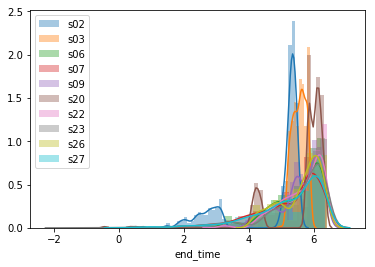

In [30]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"]), label=indv)
plt.legend()

In [31]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s


[Parallel(n_jobs=-1)]: Done 9062 out of 9062 | elapsed:    1.2s finished


(25.0, 10) (320, 800) 25.0 32 800


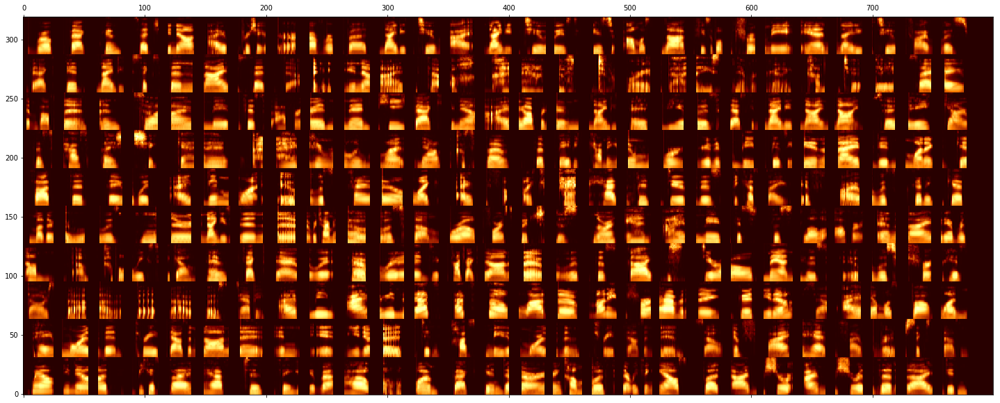

In [32]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [33]:
np.shape(syllables_spec)

(9062, 32, 29)

In [ ]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

def remove_med(x):
    x[x<=np.median(x)] = 0
    return x

syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]
#syllables_spec = [remove_med(i) for i in tqdm(syllables_spec)]

In [34]:
syllable_df['spectrogram'] = syllables_spec

In [35]:
syllable_df[:3]

,start_time,end_time,labels,utterance_number,PoS,position_in_utterance,indv,indvi,age,sex,key,audio,rate,spectrogram
0,4.885333,5.255262,well,0,RB,0,s07,0,o,f,s0702b,"[-0.009891687687084304, -0.008258749127846935,...",16000,"[[0.0, 0.0, 0.0, 0.004942009, 0.102402754, 0.0..."
1,5.698899,5.903525,yknow,0,PRP_VBP,2,s07,0,o,f,s0702b,"[0.0020050267415568897, -0.00886577761757358, ...",16000,"[[0.0, 0.0, 0.0, 0.0, 0.23456699, 0.37280002, ..."
2,5.903525,6.099023,it,0,PRP,3,s07,0,o,f,s0702b,"[-0.4616742369795508, -0.22130549839909638, -0...",16000,"[[0.0, 0.0, 0.0, 0.0, 0.34458634, 0.36319825, ..."


### view syllables per indv

In [36]:
syllable_df.indv.unique()

array(['s07', 's02', 's06', 's03', 's27', 's22', 's26', 's23', 's09',
       's20'], dtype=object)

s02 362
(50.0, 28) (448, 800) 25.0 32 800


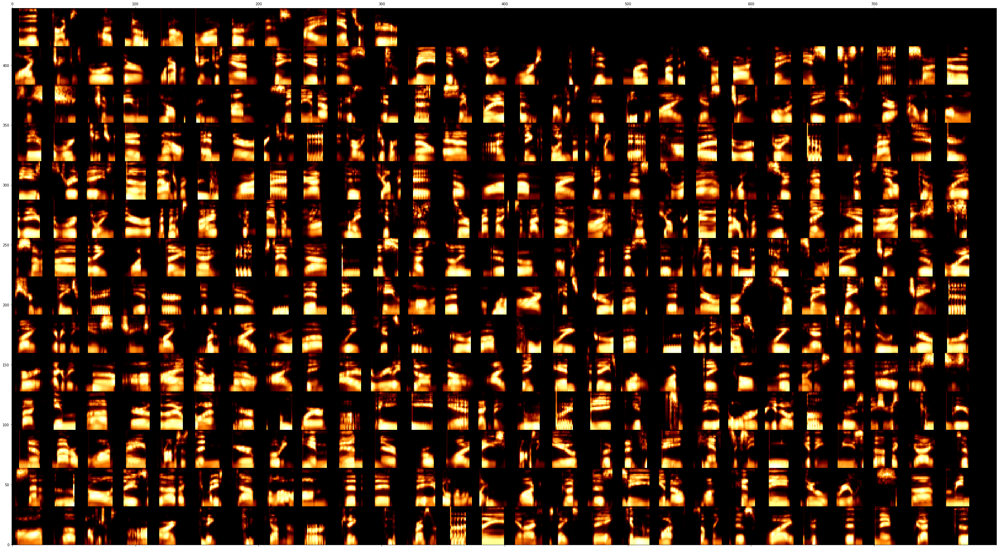

s03 404
(50.0, 30) (480, 800) 25.0 32 800


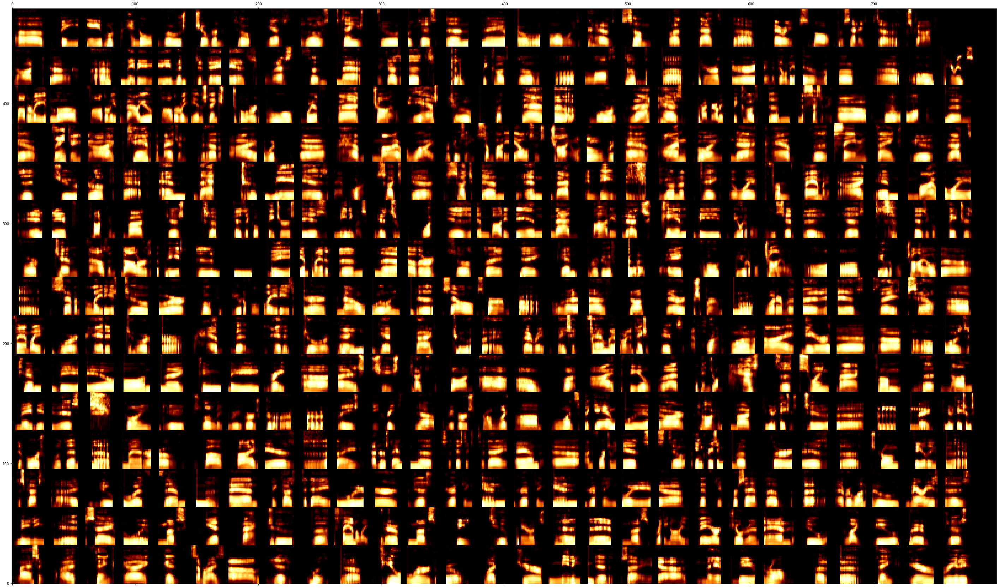

s06 667
(50.0, 32) (512, 800) 25.0 32 800


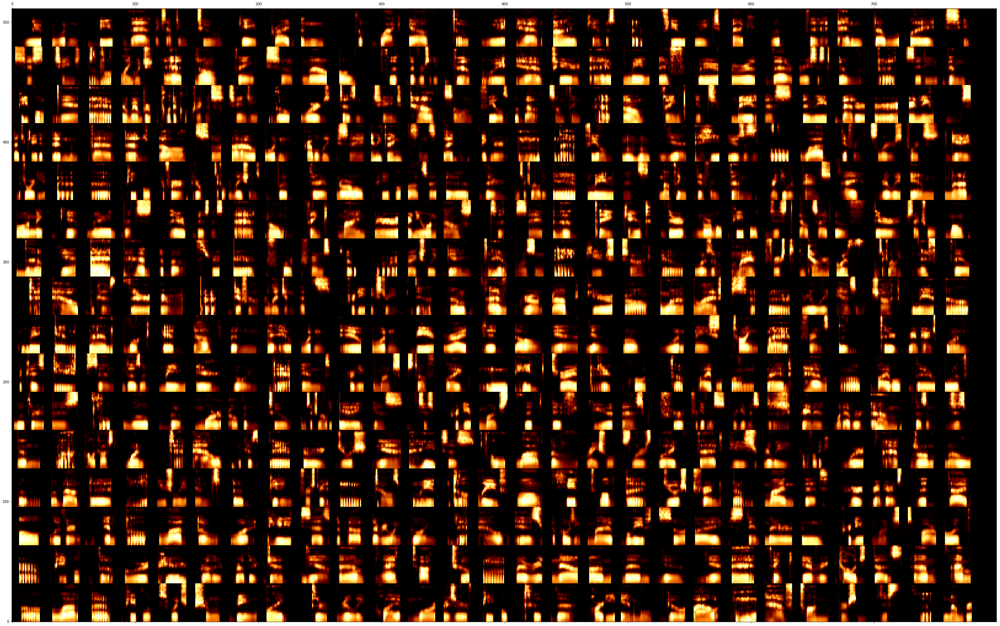

s07 1643
(50.0, 32) (512, 800) 25.0 32 800


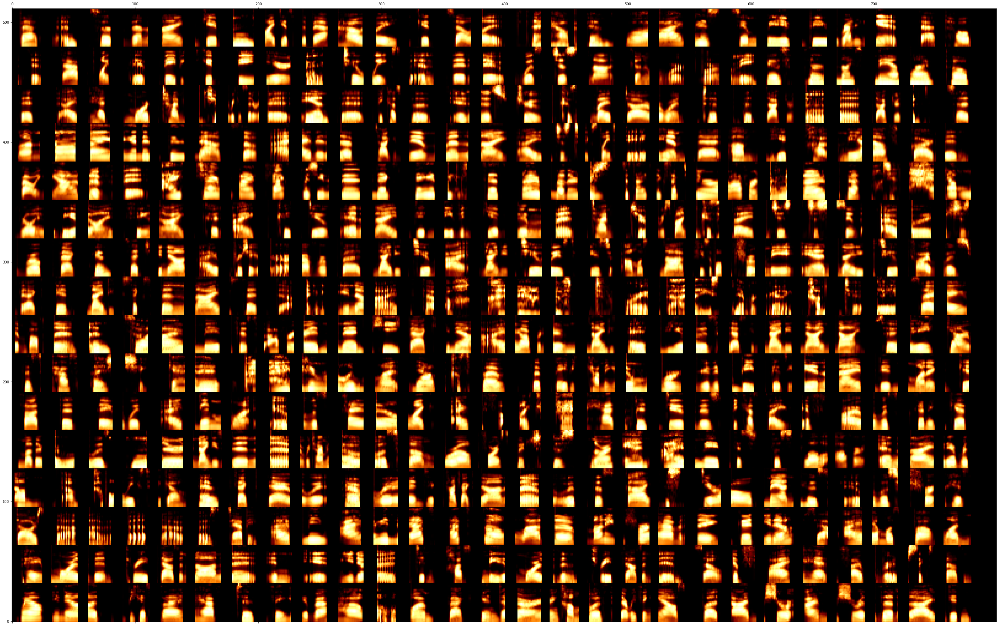

s09 1308
(50.0, 32) (512, 800) 25.0 32 800


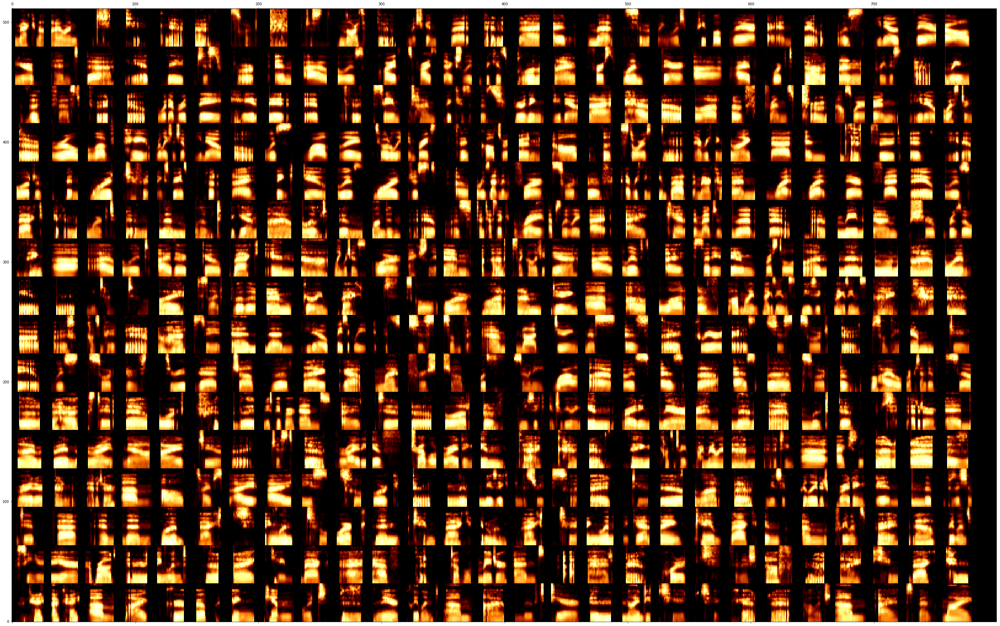

s20 385
(50.0, 30) (480, 800) 25.0 32 800


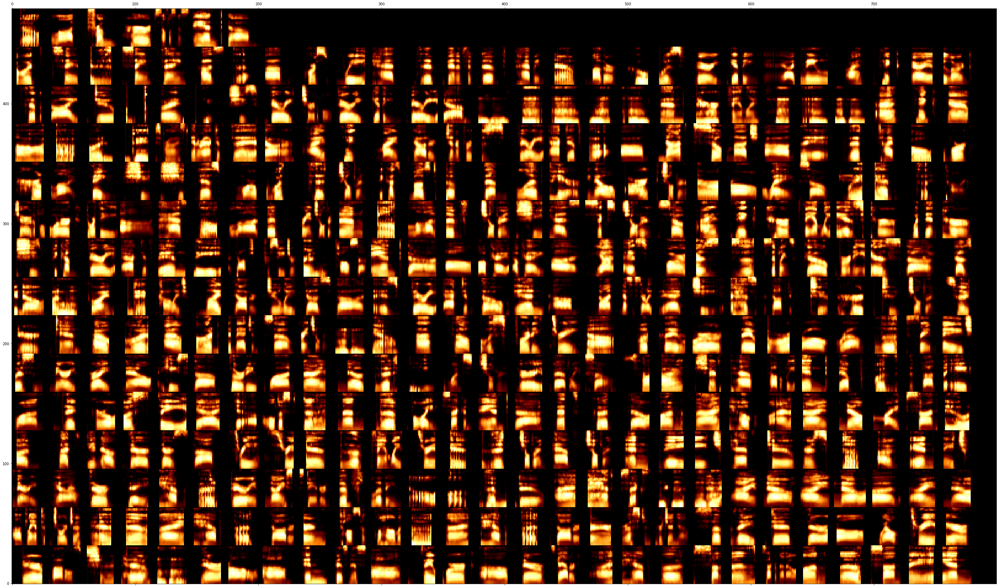

s22 1099
(50.0, 32) (512, 800) 25.0 32 800


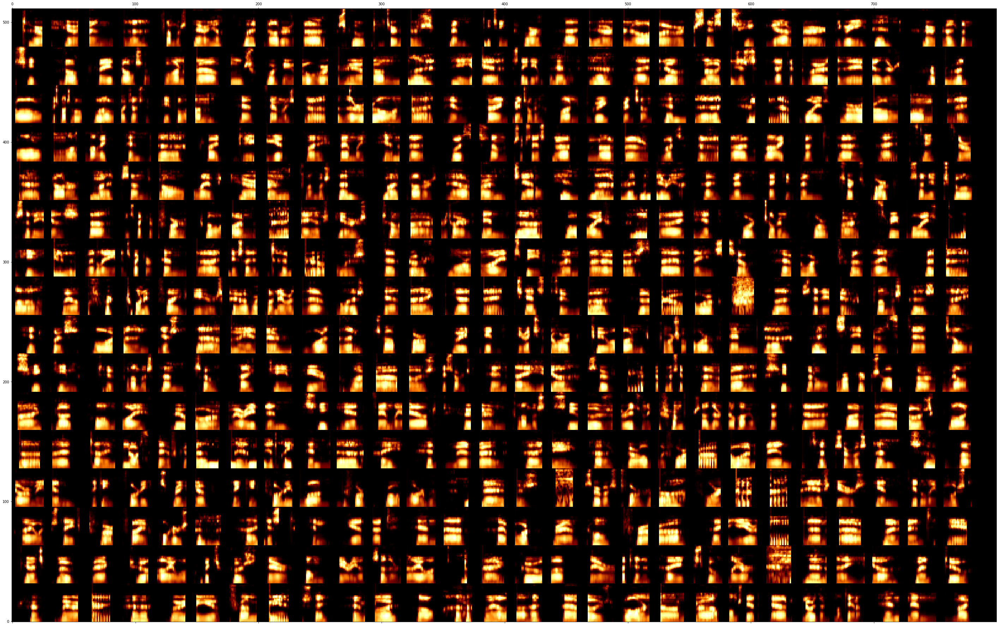

s23 1230
(50.0, 32) (512, 800) 25.0 32 800


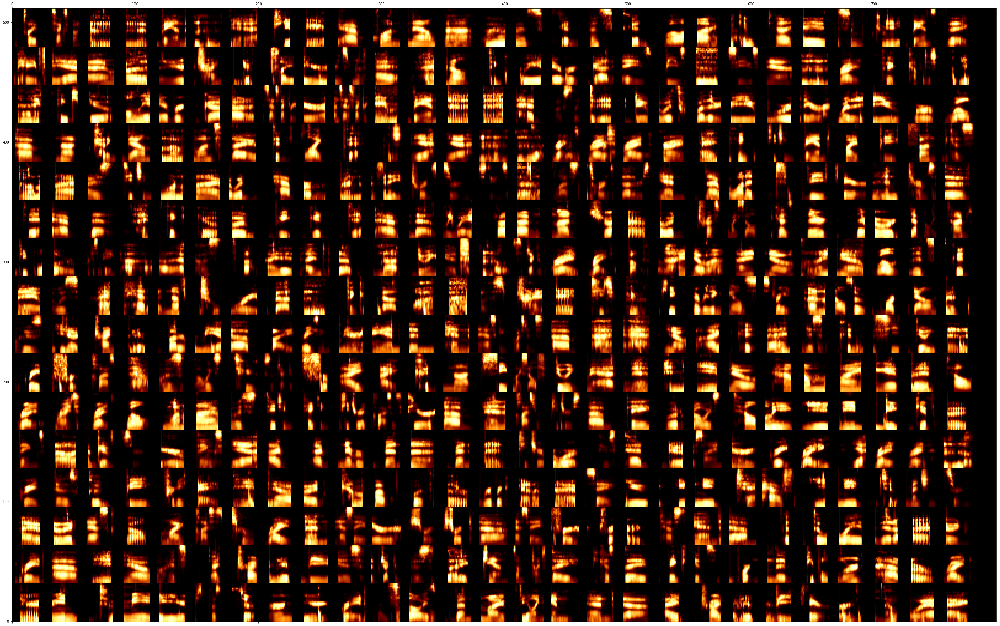

s26 837
(50.0, 32) (512, 800) 25.0 32 800


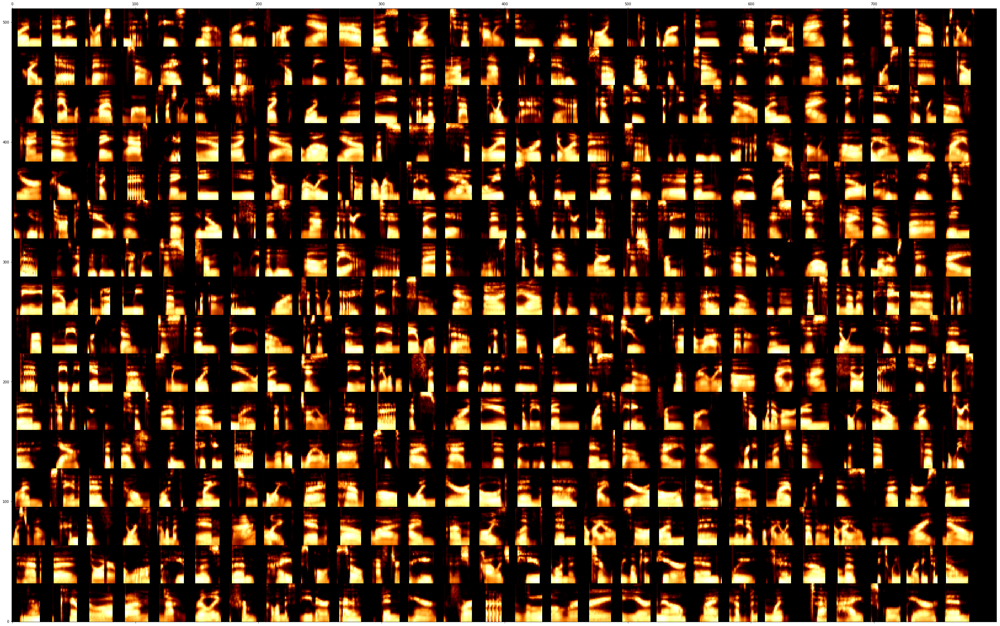

s27 1127
(50.0, 32) (512, 800) 25.0 32 800


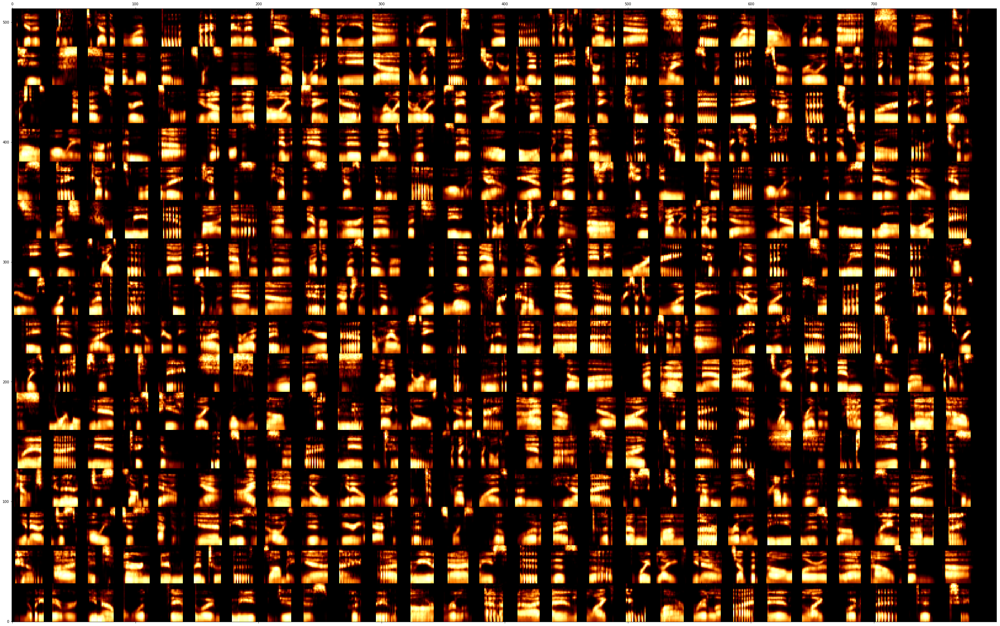

In [37]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=16, 
                  colsize=25)

### save dataset

In [39]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'words.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)